In [4]:
##!unzip "drive/MyDrive/project/dog-breed-identification.zip" -d "drive/MyDrive/project/"

## ✴ End to end multiclass dog breed classification

# This notebook builds an end-to-end multi class image classifier using TensorFlow Hub



##  Problem

Identifying the breed of a dog given the image of the DOG
##  Data
The data were using is from Kaggle's dog breed identification competition

**Link:** https://www.kaggle.com/competitions/dog-breed-identification/data

## Evaluation

The evaluation is a file for prediction probabilities for each tdog breed of each test image

**Link** www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## Features

Some information about data:

* We're dealing with images(unstructured data) so it's probably best we use deeep learning and transfer learning
* There are 10000+ images in training as well as test set


# Import tensorflow

In [5]:
import tensorflow as tf
import tensorflow_hub as hub

In [6]:
print(tf.__version__,hub.__version__)

2.17.1 0.16.1


In [7]:
## Check for GPU
print("GPU", "available (YESSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "Not available")

GPU available (YESSSSS!!!!)


## Convert the data into tensors



In [8]:
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/project/labels.csv")

In [9]:
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [10]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

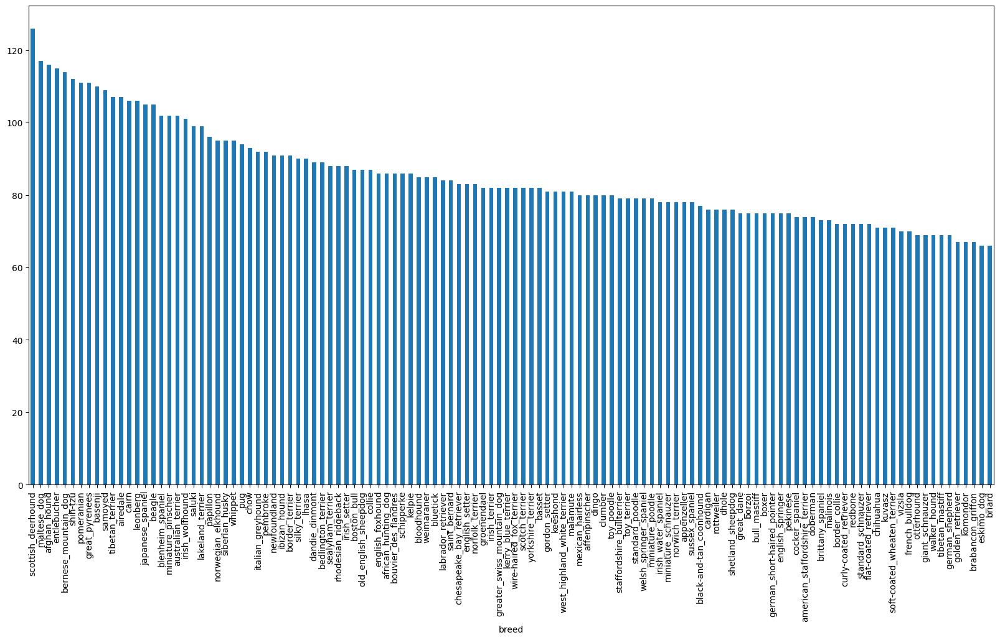

In [11]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [12]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [13]:
labels_csv["breed"].value_counts().median()

82.0

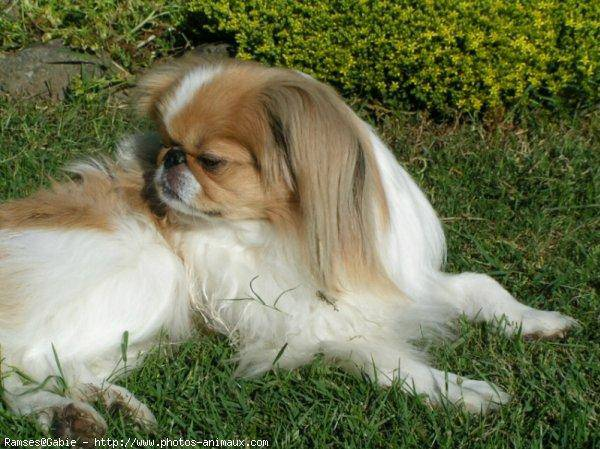

In [14]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/project/test/000621fb3cbb32d8935728e48679680e.jpg")


# Getting image and their labels

Let's get a list of our image file pathnames

In [15]:
# Create pathnames from image ids
filenames=["drive/MyDrive/project/train/"+fname+".jpg" for fname in labels_csv["id"]]

In [16]:
# Check the first 10
filenames[:10]

['drive/MyDrive/project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/project/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/project/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/project/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/project/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/project/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/project/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [17]:
## Check whether number of file names matches with actual data files
import os
if len(os.listdir("drive/MyDrive/project/train/"))==len(filenames):
  print("yes,filenames match actual amount of files")
else:
  print("Insufficient data ccording to the actual amount of the data")


yes,filenames match actual amount of files


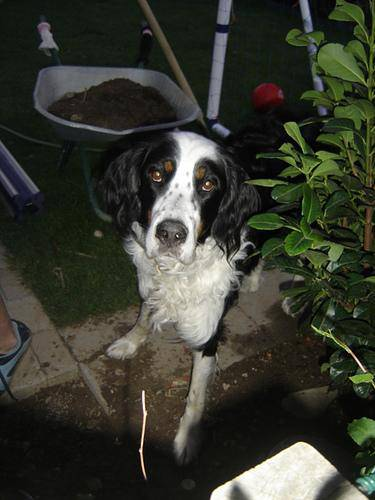

In [18]:
# One more check
Image(filenames[9000])
Image(filenames[2000])


In [19]:
labels_csv["breed"][2000]

'appenzeller'

In [20]:
# Since now we have got the training data set file paths, now loot at the labels

In [21]:
labels=labels_csv["breed"]

In [22]:
labels

,breed
0,boston_bull
1,dingo
2,pekinese
3,bluetick
4,golden_retriever
...,...
10217,borzoi
10218,dandie_dinmont
10219,airedale
10220,miniature_pinscher


In [23]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
##labels=np.array(labels) does the same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [24]:
len(labels)

10222

In [25]:
## Checking for missing data in unstructured data set

In [26]:
if len(labels)==len(filenames):
  print("Yes there is no mmissing data")
else:
  print("No the lengths do not match")

Yes there is no mmissing data


Since Now we have got our training image filepaths in a list, lets prepare our labels

In [27]:
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [28]:
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [29]:
# Turn every label into boolean array
boolean_labels= [label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [30]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds==labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where sample occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our own validation set since the data from kaggle didnt come with a validation set

In [31]:
# Setup x and y variable
X=filenames
y=boolean_labels

We are going to start off experimenting around 1000 images and increase in case we need more

In [32]:
#Set number of images to use for experimeter
NUM_IMAGES=10000 #@param {type:"slider",min:1000, max:10000, step:1000}

In [33]:
from sklearn.model_selection import train_test_split
# Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

In [34]:
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [35]:
X_train[:2],y_train[:2]

(['drive/MyDrive/project/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/project/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, Fa

## Preprocessing Images (turning images into tensors)

To preprocess our images into tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. use tensorflow to read a file and save it to a variable `image`
3. Turn our `image` (a jpg ) to tensors
Normalise
4. Resize the imageinto standardised size (shape of 224,224)
5. Return the modified image

In [36]:
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [37]:
 image.max()

255

In [38]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [39]:
IMG_SIZE=224 # Define image size
#Create a function
def process_image(image_path,img_size=IMG_SIZE):
  image=tf.io.read_file(image_path)
  #turn jpg into numerical tensor using three colours RGB
  image=tf.image.decode_jpeg(image,channels=3)
  #Convert the colour channel value from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image






# Turning our data into batches

Why turn our data into batches?
Let's say we're dealing with the processing of 10,000+ images in one go, They all might not fit into memory

Therefore we prefer around 32 images at a time

In order to use TensorFlow effectively we might want to convert our data into tensor tuple which looks like this (`image,label`


)

In [40]:
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label

In [41]:
process_image(filenames[42],boolean_labels)

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [42]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

now we've got a way to turn our data into Tuples of Tensors in the form of `(image,label)` , lets make it into batches

In [43]:
# Define a batch size, 32 is agood start
BATCH_SIZE=32

# create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image(X) and label (y) pairs

  Shuffles the data if it's training data but doesn't shuffles if it is validation data
  Also accepts testdata as inputs and not labels
  """
  #If the data is the test data sets, we wont have labels
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

    #If the data is a valid data set we wont need to shuffle it
  elif valid_data:
    print("Creating validation data batches....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data=data.shuffle(buffer_size=len(X))
    data=data.map(get_image_label)

    # Turn the training data into batches
    data_batch=data.batch(BATCH_SIZE)

  return data_batch

In [44]:
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)


Creating training data batches...
Creating validation data batches....


In [45]:
# Check out our different attributes
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing data batches

Our data is now in batches but these can still be a little hard to understand therefore let's visualize this

In [46]:
import matplotlib.pyplot as plt

def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from batch
  """
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


In [47]:
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[2.37981454e-01, 6.04779661e-01, 6.42874181e-01],
          [2.37981454e-01, 6.05086505e-01, 6.42260551e-01],
          [2.43748844e-01, 6.01259351e-01, 6.42071724e-01],
          ...,
          [4.03902948e-01, 6.32844329e-01, 6.65220022e-01],
          [3.90177161e-01, 6.30576730e-01, 6.46357119e-01],
          [3.85766834e-01, 6.32781863e-01, 6.41946793e-01]],
 
         [[2.78737754e-01, 6.31460130e-01, 6.64277673e-01],
          [2.82615572e-01, 6.30871534e-01, 6.63377464e-01],
          [2.82970935e-01, 6.31104708e-01, 6.63100481e-01],
          ...,
          [4.26918864e-01, 6.43452406e-01, 6.69837296e-01],
          [4.19063032e-01, 6.47559941e-01, 6.61436558e-01],
          [4.15773839e-01, 6.50849104e-01, 6.54858232e-01]],
 
         [[3.22006315e-01, 6.39215708e-01, 6.66666687e-01],
          [3.22006315e-01, 6.39215708e-01, 6.66666687e-01],
          [3.25927883e-01, 6.35294139e-01, 6.66666687e-01],
          ...,
          [4.62266564e-01, 6.59360409e-01, 6.7504

In [48]:
len(train_images),len(train_labels)

(32, 32)

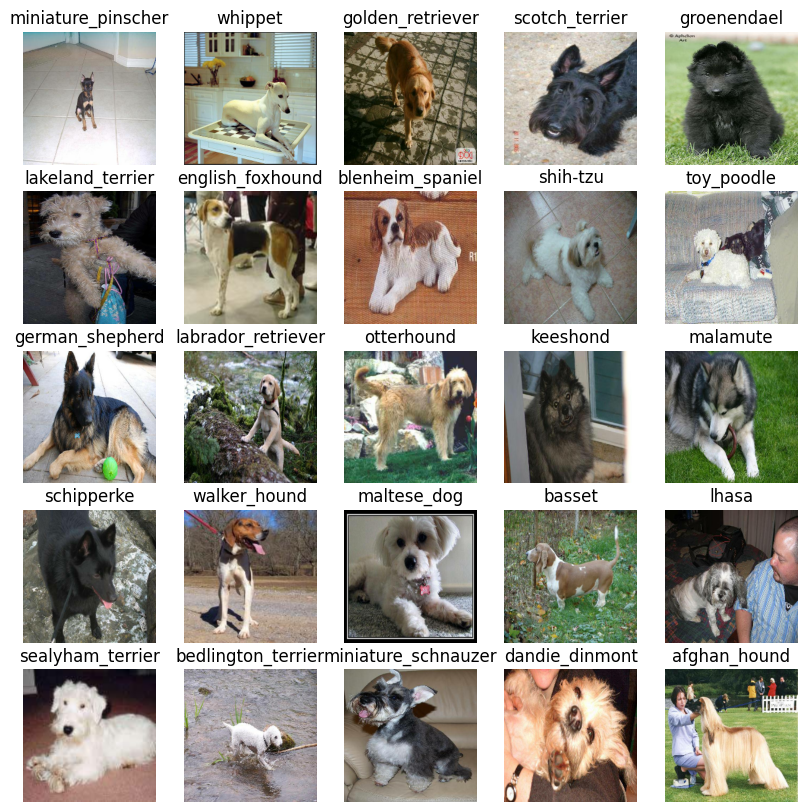

In [49]:
show_25_images(train_images,train_labels)

Visualizing validation set

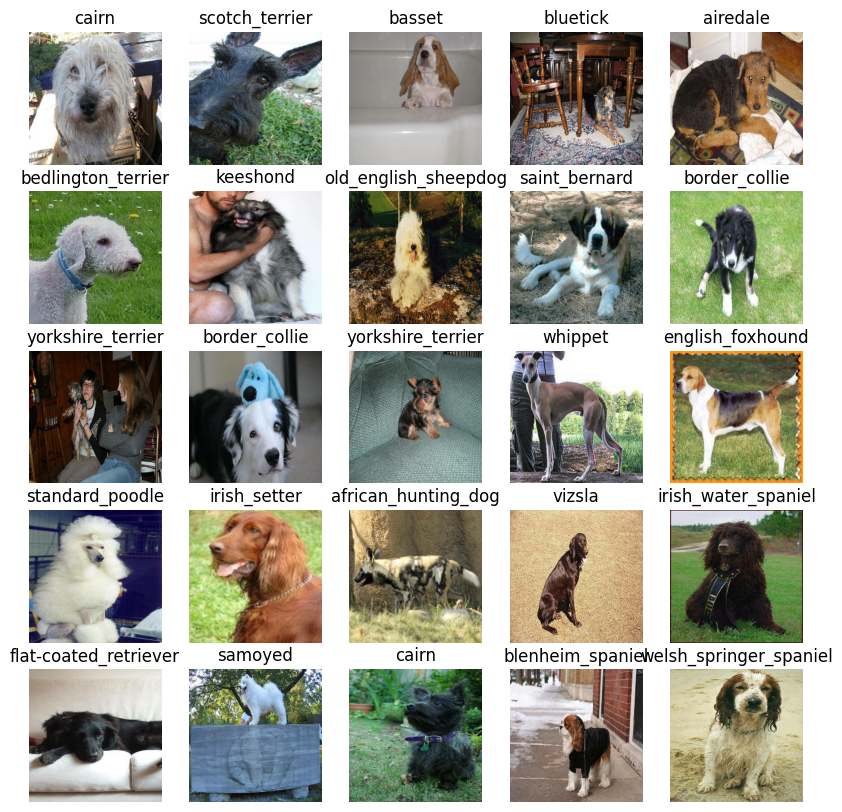

In [50]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)


## Building a model

Before we build a model, there are few things we need to define:
* The input shape(our image shape in the form of tensors)
* The output shape (image labels, in the form of tensors)
* The url of the model we want to use

In [51]:
# Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE=len(unique_breeds)
#Setup model URL from Tensorflow hub
MODEL_URL="https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

Now we have got ou inputs, outputs and models
Let's put them together in keras deep learning model

create a function
* Takes input shape output shape and the model we have chosen as parameters
* Defines the layers in keras model in sequential fashion (Do this first and then don= that)
* COmpiles the model
* Builds the model (tells the model the input shape it will be getting)
* Returns the model


In [52]:
# !pip install --upgrade tensorflow tensorflow-hub

In [53]:
 #!pip install tf_keras

In [54]:
version_fn = getattr(tf.keras, "version", None)
print("TF Version: " + tf.__version__)
print("TF Keras Version: " + version_fn())

TF Version: 2.17.1
TF Keras Version: 3.5.0


In [55]:
import tf_keras


In [56]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf_keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf_keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [57]:
model=create_model()
##model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


For binary classification(one thing or not) we use
* Activation function Sigmoid
*Loss function BinaryCrossentropy

# Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress or stop ptraining early if a model starts improving

We will create two callbacks one for tensorboard which helps track our models progress and another for early stopping which preventts our model from training too Long


## TensorBoard callback

To steup a TensorBoard callback we need to do 3 things
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our models fit function
3. Visualize our models training logs with the tensorboard extension

In [58]:
%load_ext tensorboard

In [59]:
import datetime
def create_tensorboard_callback():
  #Create a log directory for storing Tensorboard logs
  logdir=os.path.join("/content/drive/MyDrive/project/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)


In [60]:
## Early stopping callback
early_stopping=tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

# Training a model
our first model is only going to train on 1000 imagesto make sure that every thing is working

In [61]:
NUM_EPOCHS=100 #@param {type: "slider",min:10,max:100,steps:10}

In [62]:
print("GPU Available!!!!!!" if tf.config.list_physical_devices("GPU") else "Not available")

GPU Available!!!!!!


Lets create a function which trains a model
* Create a model using `create_model`
* Setup using create_tensorboard callback()
* Call thw fit() function on our model passing it the training data, validation data, number of epochs to train for, and the callbacks we'd like to use

In [63]:
def train_model():
  model=create_model()
  tensorboard=create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [64]:
model=train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 246s 10s/step - loss: 4.6660 - accuracy: 0.0950 - val_loss: 3.4785 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 4s 162ms/step - loss: 1.6973 - accuracy: 0.6612 - val_loss: 2.1763 - val_accuracy: 0.5350
Epoch 3/100
25/25 [==============================] - 4s 164ms/step - loss: 0.6082 - accuracy: 0.9150 - val_loss: 1.6347 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 5s 214ms/step - loss: 0.2649 - accuracy: 0.9875 - val_loss: 1.4417 - val_accuracy: 0.6750
Epoch 5/100
25/25 [==============================] - 4s 167ms/step - loss: 0.1540 - accuracy: 0.9950 - val_loss: 1.3534 - val_accuracy: 0.6900
Epoch 6/100
25/25 [==============================] - 5s 197ms/step - loss: 0.1049 - accuracy: 0.9987 - val_loss: 1.3098 - val_accuracy: 0.7050
Epoch 7/100
25/25 [===================

**Question** Now are model is overfitting because it is performing far better on the training ddata as compared to the validation data.
Do we have some ways to prevent model overfitting in deep learning neural networks?


**Note** Overfitting to begin with is a good thing ! This means our model is learnng well

In [67]:
%tensorboard --logdir drive/MyDrive/project/logs

Output hidden; open in https://colab.research.google.com to view.

In [68]:
# Making prediction on teh validation data
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [69]:
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 170ms/step


array([[1.6855911e-03, 2.4892885e-04, 1.9381645e-04, ..., 2.0172872e-04,
        2.7559128e-05, 1.0170913e-02],
       [2.6446073e-03, 7.8207476e-04, 3.1530768e-02, ..., 5.8528042e-04,
        5.6770486e-03, 6.7637149e-05],
       [1.2617925e-04, 9.0694011e-06, 3.6017816e-05, ..., 1.8480937e-04,
        1.7080822e-05, 2.2027774e-03],
       ...,
       [1.4402237e-06, 1.4526510e-04, 4.2630345e-05, ..., 2.1010474e-05,
        7.1761475e-05, 5.4173032e-04],
       [1.0793797e-03, 2.8518459e-04, 3.7046982e-05, ..., 2.4125364e-04,
        1.5338305e-04, 1.3189211e-02],
       [9.1625139e-04, 1.1906186e-04, 9.0264343e-04, ..., 4.0720692e-03,
        7.0483726e-04, 4.0026740e-04]], dtype=float32)

In [71]:
predictions.shape

(200, 120)